In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import pandas as pd

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Multiply, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50, EfficientNetB0, MobileNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobile_preprocess
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score, accuracy_score
from sklearn.utils.class_weight import compute_class_weight

In [3]:
# ----------------------------- Config -----------------------------
model_list = [ "MobileNetV2", "EfficientNetB0", "ResNet50"]
batch_size = 32
epochs = 15
weight_decay = 1e-4

train_dir = "E:/fruits-360_100x100 - Copy/fruits-360/Training"
test_dir = "E:/fruits-360_100x100 - Copy/fruits-360/Test"

preprocess_funcs = {
    "ResNet50": resnet_preprocess,
    "EfficientNetB0": efficientnet_preprocess,
    "MobileNetV2": mobile_preprocess
}

In [4]:
# ----------------------------- Data Augmentation -----------------------------
def replace_background(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 220, 255, cv2.THRESH_BINARY_INV)
    if np.random.rand() > 0.5:
        bg = np.random.randint(0, 255, img.shape, dtype=np.uint8)
    else:
        bg = np.zeros_like(img)
        cv2.randu(bg, 0, 255)
    return np.where(mask[..., None], img, bg)

def add_blur(img):
    return cv2.GaussianBlur(img, (5, 5), 0)

def add_noise(img):
    noise = np.random.normal(0, 25, img.shape).astype(np.float32)
    noisy_img = img.astype(np.float32) + noise
    return np.clip(noisy_img, 0, 255).astype(np.uint8)

def custom_preprocess(img, model_name):
    img = replace_background(img)
    if np.random.rand() < 0.3:
        img = add_blur(img)
    if np.random.rand() < 0.3:
        img = add_noise(img)
    return preprocess_funcs[model_name](img)

In [5]:
# ----------------------------- Squeeze-Excite Block -----------------------------
def squeeze_excite_block(inputs, ratio=16):
    channel_axis = -1
    filters = inputs.shape[channel_axis]
    se = GlobalAveragePooling2D()(inputs)
    se = Dense(filters // ratio, activation='relu')(se)
    se = Dense(filters, activation='sigmoid')(se)
    se = Reshape((1, 1, filters))(se)
    return Multiply()([inputs, se])

In [6]:
# ----------------------------- Model Builder -----------------------------
def create_transfer_model_with_se(base_model, num_classes):
    base_model.trainable = False
    x = base_model.output
    x = squeeze_excite_block(x)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(weight_decay))(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax', kernel_regularizer=l2(weight_decay))(x)
    return Model(inputs=base_model.input, outputs=predictions)

def create_model_by_name(name, input_shape, num_classes):
    if name == "ResNet50":
        base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    elif name == "EfficientNetB0":
        base = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)
    elif name == "MobileNetV2":
        base = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    else:
        raise ValueError("Unsupported model name.")
    return create_transfer_model_with_se(base, num_classes)

In [7]:
# ----------------------------- Data Generators -----------------------------
def get_augmented_generator(model_name, directory, img_size=(224, 224)):
    datagen = ImageDataGenerator(
        preprocessing_function=lambda x: custom_preprocess(x, model_name),
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.3,
        horizontal_flip=True,
        brightness_range=[0.7, 1.3],
        fill_mode='constant',
        cval=0
    )
    return datagen.flow_from_directory(
        directory,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True
    )
    
def get_simple_generator(model_name, directory, img_size=(224, 224)):
    """Generator with NO augmentation (only preprocessing)"""
    datagen = ImageDataGenerator(
        preprocessing_function=preprocess_funcs[model_name],
    )
    return datagen.flow_from_directory(
        directory,
        target_size=img_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

In [8]:
# ----------------------------- Training + Evaluation -----------------------------
def compile_and_train(model, model_name, train_data, test_data, epochs, class_weights=None):
    model.compile(optimizer=Adam(1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
    
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True),
        ModelCheckpoint(f'{model_name}_balanced_best_weights.keras', monitor='val_accuracy', save_best_only=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, verbose=1)
    ]
    
    history = model.fit(
        train_data,
        validation_data=test_data,
        epochs=epochs,
        callbacks=callbacks,
        class_weight=class_weights,
        verbose=1,
    )
    return model, history

def evaluate_model(model, test_data, model_name):
    test_data.reset()
    y_true = test_data.classes
    y_pred = model.predict(test_data, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    acc = accuracy_score(y_true, y_pred_classes)
    prec = precision_score(y_true, y_pred_classes, average='macro')
    rec = recall_score(y_true, y_pred_classes, average='macro')
    f1 = f1_score(y_true, y_pred_classes, average='macro')
    
    print(f"\nEvaluation for {model_name}")
    print(classification_report(y_true, y_pred_classes))
    
    return acc, prec, rec, f1

In [10]:
# ----------------------------- Execution -----------------------------
metrics_dict = {}
best_accuracy = 0
best_model_name = ""

for model_name in model_list:
    print(f"\n{'='*30}\nTraining {model_name} with augmentation & SE block\n{'='*30}")
    
    img_size = (224, 224)
    input_shape = img_size + (3,)
    
    train_data = get_augmented_generator(model_name, train_dir, img_size)
    test_data = get_simple_generator(model_name, test_dir, img_size)

    labels = train_data.classes
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(labels),
        y=labels
    )
    class_weights = dict(enumerate(class_weights))
    
    num_classes = len(train_data.class_indices)
    model = create_model_by_name(model_name, input_shape, num_classes)
    
    model, history = compile_and_train(model, model_name, train_data, test_data, epochs, class_weights)
    acc, prec, rec, f1 = evaluate_model(model, test_data, model_name)
    
    metrics_dict[model_name] = {
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1 Score': f1
    }
    
    if acc > best_accuracy:
        best_accuracy = acc
        best_model_name = model_name
        model.save(f"best_model_balanced_{model_name}.keras")


Training MobileNetV2 with augmentation & SE block
Found 45415 images belonging to 24 classes.
Found 15449 images belonging to 24 classes.


e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 4664s 3s/step - accuracy: 0.2845 - loss: 2.3167 - val_accuracy: 0.6455 - val_loss: 1.1490 - learning_rate: 1.0000e-04
Epoch 2/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3630s 3s/step - accuracy: 0.5913 - loss: 0.9396 - val_accuracy: 0.7145 - val_loss: 0.9004 - learning_rate: 1.0000e-04
Epoch 3/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3816s 3s/step - accuracy: 0.6763 - loss: 0.6982 - val_accuracy: 0.7681 - val_loss: 0.7582 - learning_rate: 1.0000e-04
Epoch 4/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3569s 3s/step - accuracy: 0.7156 - loss: 0.5866 - val_accuracy: 0.7959 - val_loss: 0.6669 - learning_rate: 1.0000e-04
Epoch 5/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3168s 2s/step - accuracy: 0.7498 - loss: 0.5127 - val_accuracy: 0.7907 - val_loss: 0.6534 - learning_rate: 1.0000e-04
Epoch 6/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3522s 2s/step - accuracy: 0.7698 - loss: 0.4707 - val_accuracy: 0.8401 - val_loss: 0.5188 - learning_rate: 1.0000e-04
Epoch 7/15
1420/1420 ━━━━━━━━━━━━━━━━━━━

e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3593s 3s/step - accuracy: 0.3536 - loss: 2.0713 - val_accuracy: 0.7662 - val_loss: 0.8036 - learning_rate: 1.0000e-04
Epoch 2/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3503s 2s/step - accuracy: 0.6920 - loss: 0.6740 - val_accuracy: 0.8496 - val_loss: 0.5300 - learning_rate: 1.0000e-04
Epoch 3/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3466s 2s/step - accuracy: 0.7727 - loss: 0.4840 - val_accuracy: 0.8806 - val_loss: 0.4347 - learning_rate: 1.0000e-04
Epoch 4/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 3761s 3s/step - accuracy: 0.8125 - loss: 0.3954 - val_accuracy: 0.8929 - val_loss: 0.3823 - learning_rate: 1.0000e-04
Epoch 5/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 4056s 3s/step - accuracy: 0.8290 - loss: 0.3631 - val_accuracy: 0.9045 - val_loss: 0.3510 - learning_rate: 1.0000e-04
Epoch 6/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 2895s 2s/step - accuracy: 0.8550 - loss: 0.3135 - val_accuracy: 0.9268 - val_loss: 0.2938 - learning_rate: 1.0000e-04
Epoch 7/15
1420/1420 ━━━━━━━━━━━━━━━━━━━

e:\Advanced Artificial Intelligence Project\venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 11687s 8s/step - accuracy: 0.4014 - loss: 1.8240 - val_accuracy: 0.7942 - val_loss: 0.6681 - learning_rate: 1.0000e-04
Epoch 2/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 12586s 9s/step - accuracy: 0.7693 - loss: 0.4690 - val_accuracy: 0.8480 - val_loss: 0.4508 - learning_rate: 1.0000e-04
Epoch 3/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 11672s 8s/step - accuracy: 0.8486 - loss: 0.3185 - val_accuracy: 0.8950 - val_loss: 0.3403 - learning_rate: 1.0000e-04
Epoch 4/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 10102s 7s/step - accuracy: 0.8891 - loss: 0.2385 - val_accuracy: 0.9321 - val_loss: 0.2498 - learning_rate: 1.0000e-04
Epoch 5/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 9091s 6s/step - accuracy: 0.9091 - loss: 0.1999 - val_accuracy: 0.9276 - val_loss: 0.2577 - learning_rate: 1.0000e-04
Epoch 6/15
1420/1420 ━━━━━━━━━━━━━━━━━━━━ 9816s 7s/step - accuracy: 0.9264 - loss: 0.1735 - val_accuracy: 0.9533 - val_loss: 0.1785 - learning_rate: 1.0000e-04
Epoch 7/15
1420/1420 ━━━━━━━━━━━━━━━


=== Final Comparison ===
                Accuracy  Precision    Recall  F1 Score
MobileNetV2     0.864846   0.825938  0.938811  0.866451
EfficientNetB0  0.956567   0.955944  0.981584  0.966633
ResNet50        0.966470   0.972387  0.991763  0.980896


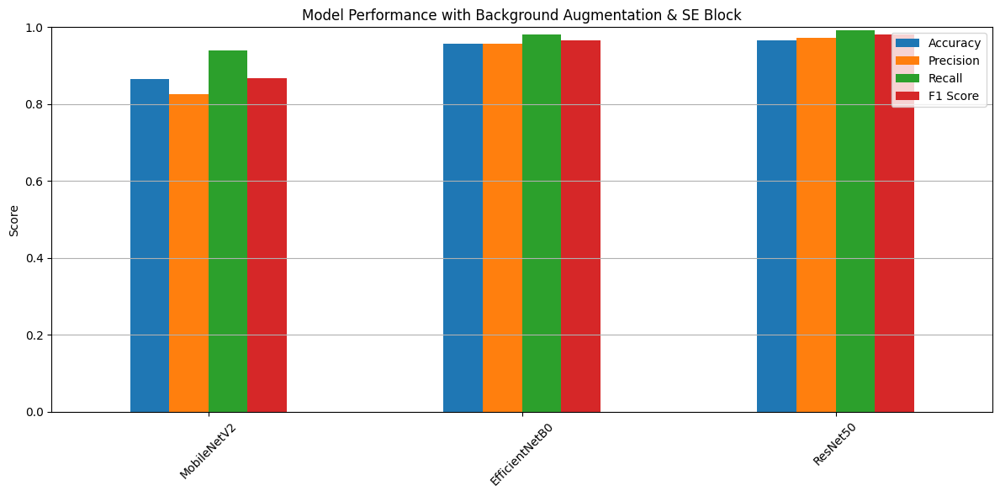


Best Model: ResNet50 (Accuracy: 96.65%)


In [11]:
# Convert to DataFrame
df = pd.DataFrame(metrics_dict).T
print("\n=== Final Comparison ===")
print(df)

# Plot
df.plot(kind='bar', figsize=(12, 6), 
        title='Model Performance with Background Augmentation & SE Block')
plt.ylabel("Score")
plt.ylim(0, 1.0)
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.tight_layout()
plt.savefig('model_comparison_balanced.png')
plt.show()

# Optional: Print best model by accuracy
best_model_name = df['Accuracy'].idxmax()
best_accuracy = df['Accuracy'].max()
print(f"\nBest Model: {best_model_name} (Accuracy: {best_accuracy:.2%})")

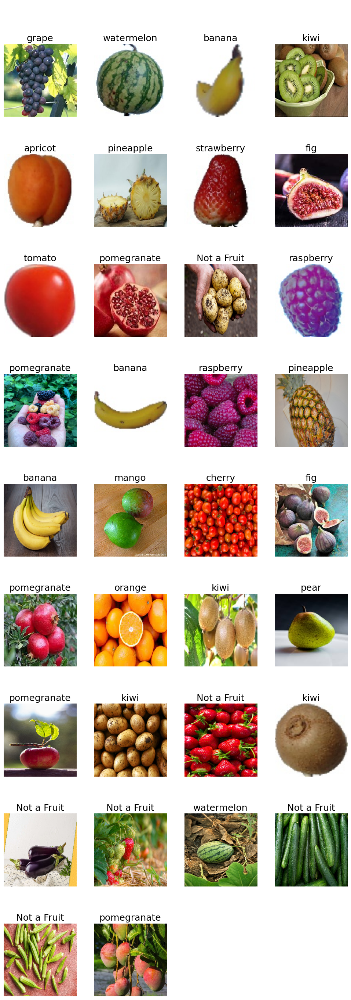

In [26]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import tensorflow as tf

model = tf.keras.models.load_model('best_model_balanced_EfficientNetB0.keras')

class_labels = list(train_data.class_indices.keys())

custom_img_dir = 'E:/custom_test_images'

image_files = [f for f in os.listdir(custom_img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
image_paths = [os.path.join(custom_img_dir, f) for f in image_files]

plt.figure(figsize=(10, 3 * len(image_paths)))  
for i, img_path in enumerate(image_paths):
    img = image.load_img(img_path, target_size=(224, 224))  
    img_array = image.img_to_array(img)
    img_array = efficientnet_preprocess(img_array)  
    img_array = np.expand_dims(img_array, axis=0)

    prediction = model.predict(img_array, verbose=0)[0]
    max_prob = np.max(prediction)
    predicted_label = class_labels[np.argmax(prediction)] if max_prob >= 0.45 else "Not a Fruit"

    plt.subplot(len(image_paths), 4, i + 1)  
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'\n\n\n{predicted_label}', fontsize=18)

plt.tight_layout()
plt.show()

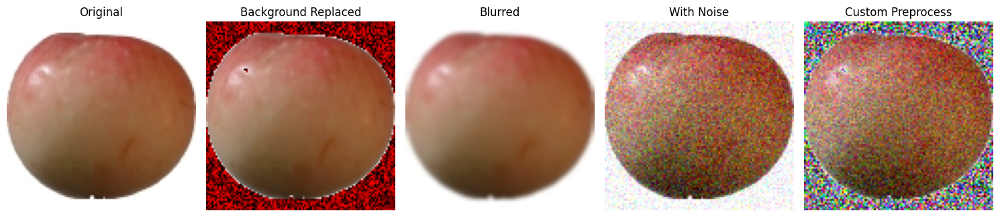

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import cv2

# Set your image path
img_path = 'E:/fruits-360_100x100/fruits-360/Test/apple/apple_1.jpg' 

# Load and convert to array
img = image.load_img(img_path, target_size=(100, 100))
img = image.img_to_array(img).astype(np.uint8)

# Apply each augmentation
img_bg = replace_background(img)
img_blur = add_blur(img)
img_noise = add_noise(img)

# Apply full custom preprocessing (with randomness)
img_custom = custom_preprocess(img.copy(), "EfficientNetB0")

# Plot the results
plt.figure(figsize=(15, 6))

titles = ["Original", "Background Replaced", "Blurred", "With Noise", "Custom Preprocess"]
images = [img, img_bg, img_blur, img_noise, img_custom]

for i, (title, im) in enumerate(zip(titles, images)):
    plt.subplot(1, 5, i + 1)
    plt.imshow(im.astype(np.uint8))
    plt.title(title, fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()

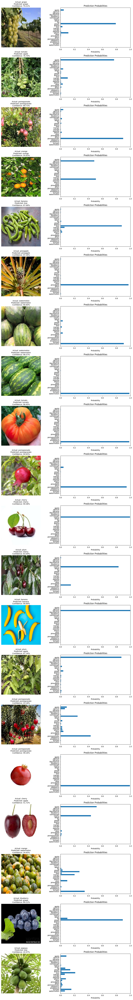

In [22]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import tensorflow as tf
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess

# Load your model
try:
    model = tf.keras.models.load_model('best_model_balanced_EfficientNetB0.keras')
except Exception as e:
    print(f"Error loading model: {e}")
    print("Please ensure 'best_model_balanced_EfficientNetB0.keras' is in the same directory or provide the full path.")
    exit()

# Set the directory containing class subfolders
custom_img_root = 'E:/Fruit-262'

# --- Collect all image paths ---
all_image_paths = []
for root, dirs, files in os.walk(custom_img_root):
    for f in files:
        if f.lower().endswith(('.png', '.jpg', '.jpeg')):
            all_image_paths.append(os.path.join(root, f))

if not all_image_paths:
    print(f"No image files found in '{custom_img_root}' or its subdirectories. Please check the path and file types.")
    exit()

# Determine class labels from the directory structure (assuming each subfolder is a class)
# This assumes your directory structure is like: custom_img_root/class_name/image.jpg
class_labels = sorted([d for d in os.listdir(custom_img_root) if os.path.isdir(os.path.join(custom_img_root, d))])

if not class_labels:
    print(f"Could not determine class labels from subfolders in '{custom_img_root}'.")
    print("Please ensure your dataset has subfolders named after classes.")
    exit()

# --- Select a specific number of random images ---
num_random_images_to_select = 20  # You can adjust this number

if len(all_image_paths) < num_random_images_to_select:
    print(f"Warning: Only {len(all_image_paths)} images found. Selecting all available images.")
    selected_images = all_image_paths
else:
    selected_images = random.sample(all_image_paths, num_random_images_to_select)

# --- Plot and predict ---
# Adjusting the figure size for better visualization, making it dynamic based on the number of images
plt.figure(figsize=(12, 4 * len(selected_images)))

for i, img_path in enumerate(selected_images):
    try:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = efficientnet_preprocess(img_array)
        img_array = np.expand_dims(img_array, axis=0)

        prediction = model.predict(img_array, verbose=0)[0]
        predicted_class_index = np.argmax(prediction)
        predicted_label = class_labels[predicted_class_index]
        confidence = prediction[predicted_class_index] * 100 # Convert to percentage

        plt.subplot(len(selected_images), 2, 2 * i + 1) # Image subplot
        plt.imshow(img)
        plt.axis('off')
        # Extract the actual label from the image path (assuming folder name is the label)
        actual_label = os.path.basename(os.path.dirname(img_path))
        plt.title(f"Actual: {actual_label}\nPredicted: {predicted_label}\nConfidence: {confidence:.2f}%", fontsize=10)

        # Plotting confidence scores
        plt.subplot(len(selected_images), 2, 2 * i + 2) # Bar plot for confidence
        y_pos = np.arange(len(class_labels))
        plt.barh(y_pos, prediction, align='center')
        plt.yticks(y_pos, class_labels)
        plt.xlabel('Probability')
        plt.title('Prediction Probabilities')
        plt.xlim(0, 1) # Ensure x-axis goes from 0 to 1
        plt.gca().invert_yaxis() # Labels read top-to-bottom

    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        continue # Skip to the next image if an error occurs

plt.tight_layout()
plt.show()